# Ranking lipids with LINEX$^2$

The goal of this package/notebook is, to rank annotations for ions from SpaceM/METASPACE data.
Currently, this only works for lipids.

The principle of the workflow is shown in the schematic below. It builds on the [LINEX$^2$](https://doi.org/10.1093/bib/bbac572) algorithm to compute data specific lipid network.

![Schematic](figures/schematic.png)

# Load packages

## Install `linex2metaspace`

1. open a terminal (My instructions are written for linux systems)

2. clone the github repository from: https://git.embl.de/trose/linex2_for_maldi

`git clone git@git.embl.de:trose/linex2_for_maldi.git` or `git clone https://git.embl.de/trose/linex2_for_maldi.git`

enter the directory

`cd linex2_for_maldi`

3. If you already cloned it, pull the latest updates

`git pull`

4. Install the python package in development mode (In this way you don't need to reinstall it when you pull the latest updates

`python -m pip install -e .`

In [20]:
import os
import ast
import pandas as pd
import numpy as np
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt


import linex2metaspace as lx2m
import scanpy as sc

plt.rcParams['figure.figsize'] = [9, 8]
plt.rcParams['figure.dpi'] = 300

# Load AnnData

Load a SpaceM AnnData object.

The data is expected to be preprocessed (cells/ions filtered, log-transformed, ...). 

In [2]:
# You can use any SpaceM AnnData object.
path_to_anndata = '/home/trose/projects/tcells1/data/adata_tim_slide1_customdb.h5ad'


adata = sc.read_h5ad(path_to_anndata)
adata

AnnData object with n_obs × n_vars = 26446 × 864
    obs: 'center_x', 'center_y', 'cell_area', 'cell_sampling_area', 'cell_sampling_ratio', 'cell_nearest_am_distance', 'cell_nearest_cell_distance', 'centroid-0', 'centroid-1', 'bbox-0', 'bbox-1', 'bbox-2', 'bbox-3', 'local_centroid-0', 'local_centroid-1', 'area', 'filled_area', 'solidity', 'perimeter', 'eccentricity', 'euler_number', 'moments_hu-0', 'moments_hu-1', 'moments_hu-2', 'moments_hu-3', 'moments_hu-4', 'moments_hu-5', 'moments_hu-6', 'moments_central-0-0', 'moments_central-0-1', 'moments_central-0-2', 'moments_central-0-3', 'moments_central-1-0', 'moments_central-1-1', 'moments_central-1-2', 'moments_central-1-3', 'moments_central-2-0', 'moments_central-2-1', 'moments_central-2-2', 'moments_central-2-3', 'moments_central-3-0', 'moments_central-3-1', 'moments_central-3-2', 'moments_central-3-3', 'inertia_tensor_eigvals-0', 'inertia_tensor_eigvals-1', 'major_axis_length', 'minor_axis_length', 'weighted_moments_central-0-0-DAPI',

In [3]:
# Requires columns

# adata.obs column, in which experimental conditions for comparison are saved.
# Conditions are not required for computing the network and ranking lipids. 
# For some downstream analyses & visualizations they are required (at the end of this notebook),
# but until this part everything can be executed without conditions.
cond = 'condition'

# adata.var column with molecule names
mol_names = 'moleculeNames'

In H5AD objects, Lists are usually saved as strings. For our analysis we need to convert the columns with the list of molecules back to a list.

In [4]:
if type(adata.var[mol_names][0]) is str:
    app_list = []
    for i in adata.var.index:
        app_list.append(ast.literal_eval(adata.var.loc[i, mol_names]))
    adata.var[mol_names] = pd.Series(app_list, index=adata.var.index)

Now it should be a list:

In [5]:
type(adata.var[mol_names][0])

list

# Read lipids with LINEX$^2$

To initiate LINEX$^2$, we need to load the reference classes and class reactions.

In [6]:
# LINEX2 preprocessing
ref_lip_dict = lx2m.get_lx2_ref_lip_dict()
class_reacs = lx2m.get_organism_combined_class_reactions(ref_lip_dict=ref_lip_dict, organism='HSA')

In the next step, the molecule names are parsed by LINEX$^2$. Only lipids that are successfully translated into internal lipid objects will be considred for the ranking. The supported lipid classes are in `ref_lip_dict`.

In [7]:
parsed_lipids = lx2m.parse_annotation_series(adata.var[mol_names], 
                                             ref_lip_dict, 
                                             verbose=False) # True if you want to see all lipids that were not parsed

keep_annotations = lx2m.annotations_parsed_lipids(parsed_lipids)
parsed_annotations = adata.var.copy()
parsed_annotations['parsed_lipids'] = parsed_lipids
parsed_annotations = parsed_annotations.loc[keep_annotations,:]

/mnt/c/Users/trose/postdoc/projects/python_packages/linex2_package/linex2/lipid.py:83: UserWarning: DB positions does not match the number of double bonds
  warnings.warn("DB positions does not match the number of double bonds")


The table `parsed_annotations` is a copy of `adata.var` and has the additional column 'parsed_lipids' with all translated lipid objects. Some of the lipids might be represented with a slightly nomenclature.

# Compute network

This is the basis for the ranking of the lipids.
Computing might take several minutes. Will be faster with less bootstraps, but results in lower robustness.

In [9]:
bootstraps = 30

net = lx2m.bootstrap_networks(
        lx2m.unique_sum_species(parsed_annotations['parsed_lipids']),
        parsed_annotations['parsed_lipids'],
        n=bootstraps,
        lx2_class_reacs=class_reacs,
        lx2_reference_lipids=lx2m.get_lx2_ref_lips(),
        return_composed=True
    )

1 / 30
2 / 30
3 / 30
4 / 30
5 / 30
6 / 30
7 / 30
8 / 30
9 / 30
10 / 30
11 / 30
12 / 30
13 / 30
14 / 30
15 / 30
16 / 30
17 / 30
18 / 30
19 / 30
20 / 30
21 / 30
22 / 30
23 / 30
24 / 30
25 / 30
26 / 30
27 / 30
28 / 30
29 / 30
30 / 30


## Network visualizations

Visualizations of the lipid network can help you to understand and intepret the results.

The first network shows a union of all the networks computed during the bootstraps. It shows for each lipid species all the connections it achieves in at least one bootstrap. It gives you an overview which lipids are very well connected and which ones are less connected.

However, it does not show us any information about the ions.

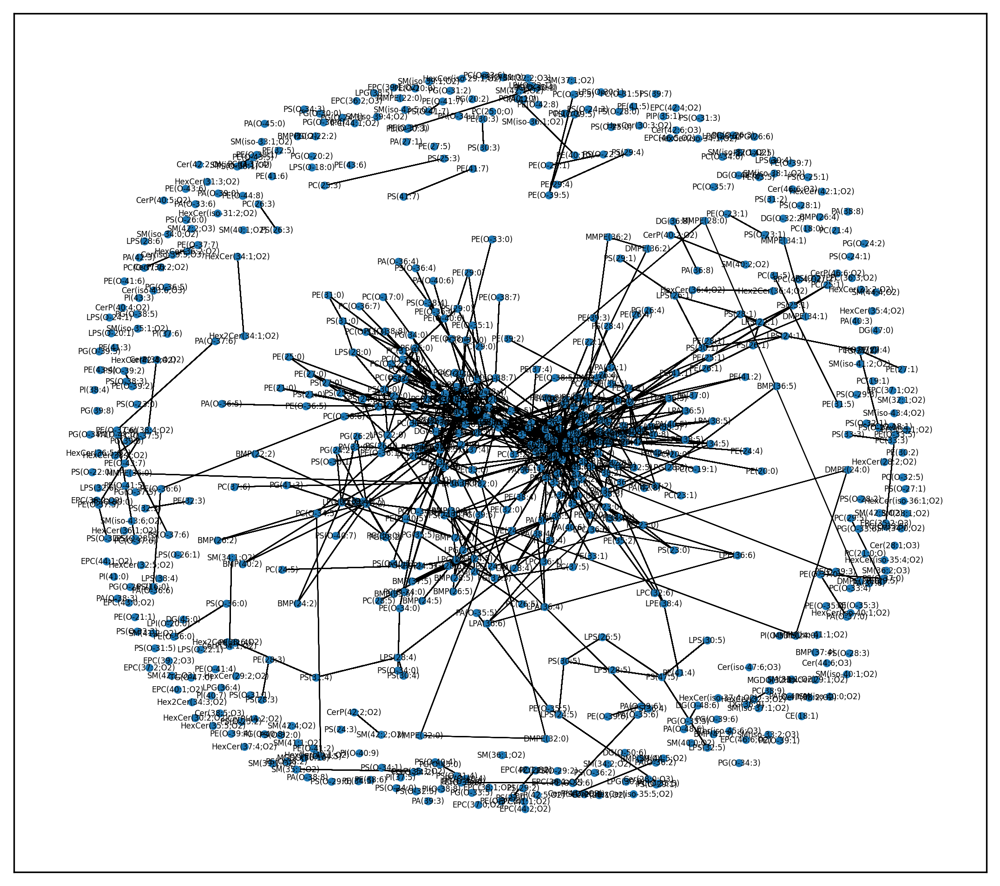

In [10]:
# Compute a layout for the network
pos = nx.spring_layout(net, k=.8)

nx.draw_networkx_nodes(net, pos=pos, node_size=10)
nx.draw_networkx_edges(net, pos=pos, width=.5)
nx.draw_networkx_labels(net, pos=pos, font_size=4)
plt.show()

In [11]:
ion_net = lx2m.ion_weight_graph(net, 
                           lx2m.unique_sum_species(parsed_annotations['parsed_lipids']), 
                           bootstraps=bootstraps,
                           parsed_lipids=parsed_annotations['parsed_lipids'],
                           #feature_similarity=feature_sim
                          )

Below you can see the ion network. It shows connections between ions that have been achieved during the bootstraps. We can see that many ions have no connections. This means that we **don't** have any information to rank the lipid candicates for them (Important to keep in mind).

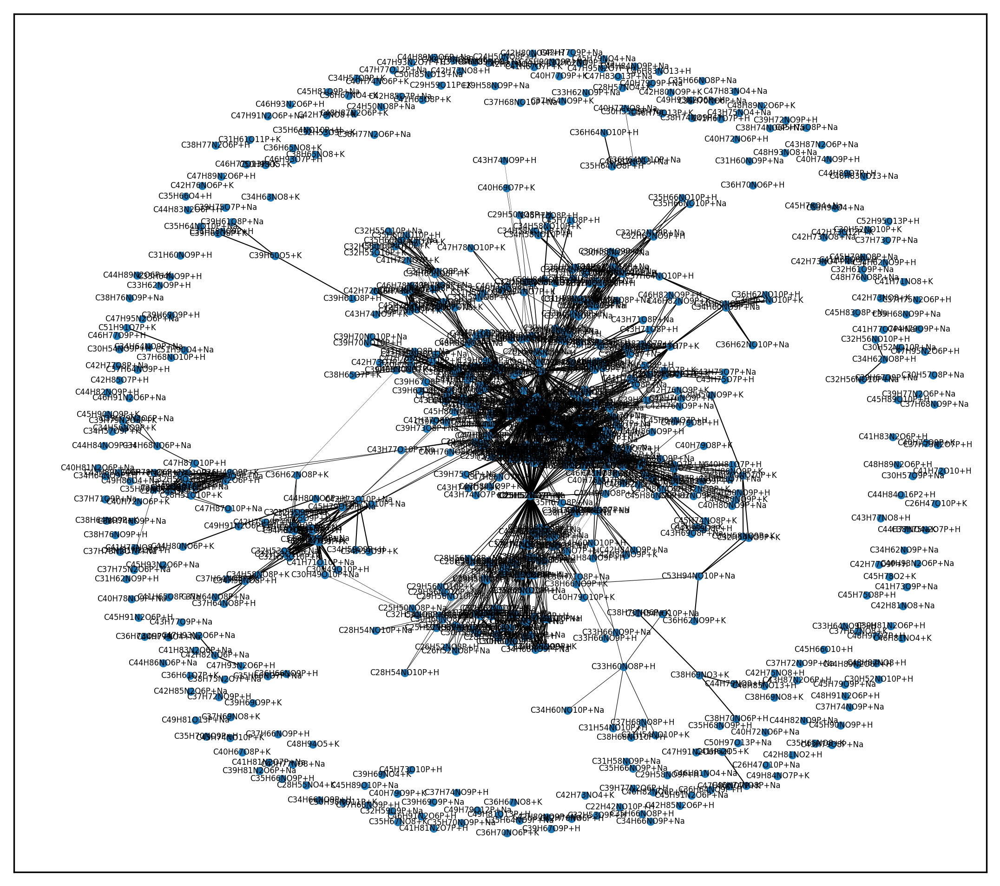

In [12]:
pos = nx.spring_layout(ion_net, k=.1)

nx.draw_networkx_nodes(ion_net, pos=pos, node_size=10)
# Edge width proportional to connection frequency
nx.draw_networkx_edges(ion_net, pos=pos, width=[d['weight']/2 for u, v, d in ion_net.edges(data=True)])
nx.draw_networkx_labels(ion_net, pos=pos, font_size=4)
plt.show()

The final network shows the ion graph, but now with the label corresponding to the ranked lipid candidates.

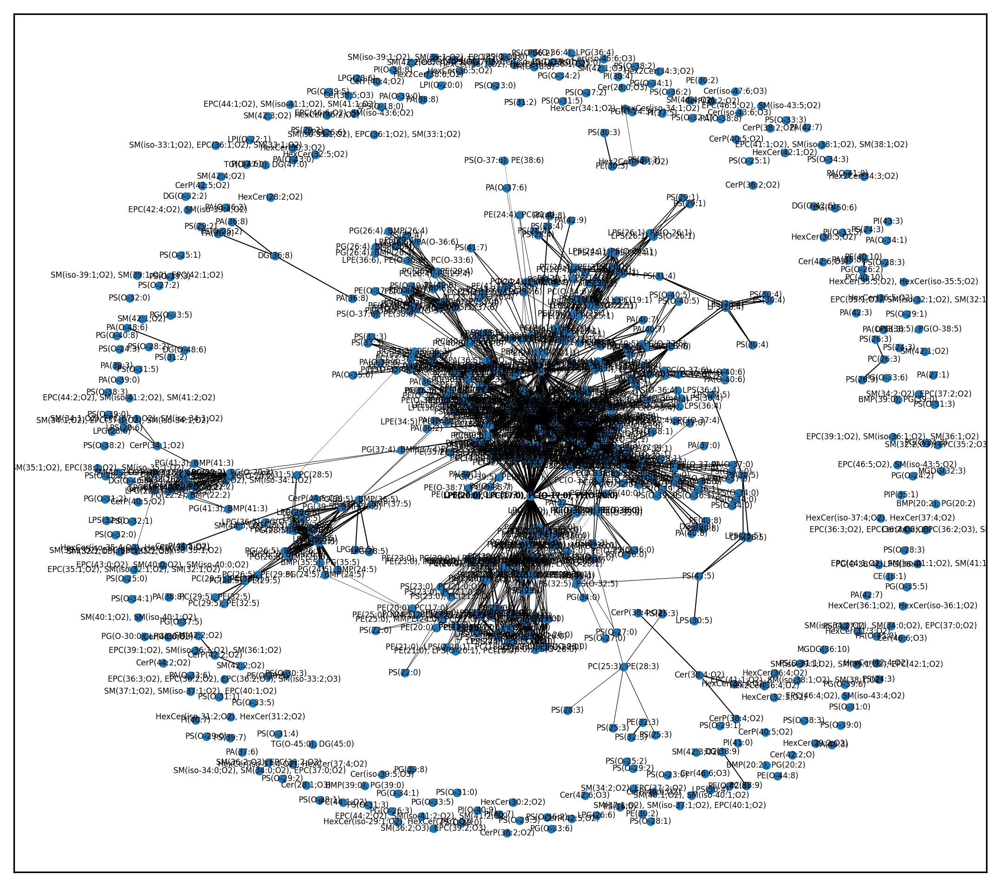

In [13]:
#pos = nx.spring_layout(ig, k=.1)
nx.draw_networkx_nodes(ion_net, pos=pos, node_size=12, )
nx.draw_networkx_edges(ion_net, pos=pos, width=[d['weight']/2 for u, v, d in ion_net.edges(data=True)])
#nx.draw_networkx_edge_labels(ig, 
#                             pos=pos, 
#                             edge_labels={(u, v): round(d['weight'], 2) for u, v, d in ig.edges(data=True)}, 
#                             font_size=4)
nx.draw_networkx_labels(ion_net, pos=pos,
                        labels={k: ", ".join(v['sum_species'].index) for k, v in dict(ion_net.nodes(data=True)).items()},
                        font_size=4)
plt.show()

## Ranking results

The ranking of annotations for each ion is stored as node attributes in the network.
Below, this information is saved as a dict, with the ion as key and attributes as values.
It includes following attributes:
* `sum_species`: Ranked lipid sum species as as `pd.Series`. It is sorted in descending order and shows for each lipid sum species, its average number of neighbors in the bootstraps. Higher values mean more likely. I did not develop a cut-off metric to decide which annotations to keep/remove.
* `parsed_lipids`: Considred annotations for the ranking. These are in the molecular species format, for the ranking they are converted to sum species. Only those lipids are used by the ranking method. If a lipid is in the 'moleculeName' column, but not here it means that is was not considred and **not** that it is unlikely.

In [14]:
nodes = dict(ion_net.nodes(data=True))

nodes[list(nodes.keys())[4]]

{'sum_species': PE(20:0)    1.0
 PC(17:0)    0.0
 dtype: float64,
 'parsed_lipids': [PC(4:0_13:0),
  PC(3:0_14:0),
  PC(2:0_15:0),
  PC(2:0_15:0),
  PC(3:0_14:0),
  PC(4:0_13:0),
  PE(10:0_10:0),
  PE(8:0_12:0),
  PE(6:0_14:0),
  PE(4:0_16:0),
  PE(3:0_17:0),
  PE(2:0_18:0),
  PE(2:0_18:0),
  PE(3:0_17:0),
  PE(4:0_16:0),
  PE(6:0_14:0),
  PE(8:0_12:0)]}

# Creating output table

Now we are creating the output table. This will be the same table as the input table with two additional columns:

* **ranked_lipids**: List of lipids in ranked order (First is the most likely, and last is the least likely)
* **is_ranked**: (`True/False`) Was the method able to rank lipids using the networks. If none of the annotations got any neighbors in the network, then they could not be ranked.
* **utilized_sum_species**: In the first step, LINEX2 in parsing all the lipids and converting them into sum species. However,  it is not compatible with all potential lipids. Only those lipids in this column are used by the method and part of the ranking. If a lipid is in the 'moleculeName' column, but not here it means that is was not considred and **not** that it is unlikely.

The `ranked_lipids` column does not include the actual values of the ranking. To check this, please look at the `nodes` dict for the ions of interest.

In [15]:
ranked_lipids = {}
is_ranked = {}
utilized_sum_species = {}

# Loop over ions in network
for ion in ion_net.nodes():
    
    # In this case the ion did not have any connections in the network
    # and the method was not able to rank the lipids
    if all(ion_net.nodes[ion]['sum_species'].values == 0):
        is_ranked[ion] = False
        ranked_lipids[ion] = ""
        utilized_sum_species[ion] = "|".join(ion_net.nodes[ion]['sum_species'].index)
    else:
        ion_ranking = ion_net.nodes[ion]['sum_species']
        # Only show lipids in ranking which have had at least one neighbor
        ion_ranking = ion_ranking[ion_ranking > 0]
        
        is_ranked[ion] = True
        ranked_lipids[ion] = "|".join(ion_ranking.index)
        utilized_sum_species[ion] = "|".join(ion_net.nodes[ion]['sum_species'].index)
                                      
parsed_annotations['ranked_lipids'] = pd.Series(ranked_lipids)
parsed_annotations['is_ranked'] = pd.Series(is_ranked)
parsed_annotations['utilized_sum_species'] = pd.Series(utilized_sum_species)

In [16]:
parsed_annotations

,annotation_id,formula,adduct,ionFormula,ion,mz,fdr,databases,moleculeNames,moleculeIds,...,msm-5,msm-6,msm-7,msm-8,msm-9,n_cells,parsed_lipids,ranked_lipids,is_ranked,utilized_sum_species
C22H42NO10P+H,C22H42NO10P+H,C22H42NO10P,+H,C22H43NO10P,C22H42NO10P+H+,512.261870,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]","[PS(10:0/6:0), PS(12:0/4:0), PS(13:0/3:0), PS(...","[""1"", ""2"", ""3"", ""4"", ""5"", ""6"", ""7"", ""8"", ""9""]",...,0.000000,0.000000,0.0,0.000000,0.000000,682,"[PS(6:0_10:0), PS(4:0_12:0), PS(3:0_13:0), PS(...",,False,PS(16:0)
C24H50NO8P+H,C24H50NO8P+H,C24H50NO8P,+H,C24H51NO8P,C24H50NO8P+H+,512.334641,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]",[PS(O-18:0/0:0)],"[""10""]",...,0.000000,0.000000,0.0,0.000000,0.000000,764,[LPS(O-18:0)],,False,LPS(O-18:0)
C24H50NO8P+Na,C24H50NO8P+Na,C24H50NO8P,+Na,C24H50NO8PNa,C24H50NO8P+Na+,534.316586,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]",[PS(O-18:0/0:0)],"[""10""]",...,0.000000,0.000000,0.0,0.000000,0.000000,107,[LPS(O-18:0)],,False,LPS(O-18:0)
C24H52NO6P+Na,C24H52NO6P+Na,C24H52NO6P,+Na,C24H52NO6PNa,C24H52NO6P+Na+,504.342407,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]",[PC(O-16:0/0:0)],"[""11""]",...,0.131835,0.146884,0.0,0.082028,0.000000,1687,[LPC(O-16:0)],LPC(O-16:0),True,LPC(O-16:0)
C25H50NO8P+H,C25H50NO8P+H,C25H50NO8P,+H,C25H51NO8P,C25H50NO8P+H+,524.334641,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]","[PC(13:0/4:0), PC(14:0/3:0), PC(15:0/2:0), PC(...","[""12"", ""13"", ""14"", ""15"", ""16"", ""17"", ""18"", ""19...",...,0.000000,0.000000,0.0,0.000000,0.000000,839,"[PC(4:0_13:0), PC(3:0_14:0), PC(2:0_15:0), PC(...",PE(20:0),True,PE(20:0)|PC(17:0)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C51H90O4+Na,C51H90O4+Na,C51H90O4,+Na,C51H90O4Na,C51H90O4+Na+,789.673093,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]","[DG(O-24:0/0:0/24:6(6Z,9Z,12Z,15Z,18Z,21Z)), D...","[""12081"", ""12082"", ""12083"", ""12084"", ""12085"", ...",...,0.065442,0.000000,0.0,0.035754,0.000000,1017,"[DG(O-24:0_24:6(6Z,9Z,12Z,15Z,18Z,21Z)), DG(O-...",DG(O-48:6),True,DG(O-48:6)
C51H91O7P+K,C51H91O7P+K,C51H91O7P,+K,C51H91O7PK,C51H91O7P+K+,885.613361,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]","[PA(O-14:0/34:6(16Z,19Z,22Z,25Z,28Z,31Z)), PA(...","[""12090"", ""12091"", ""12092"", ""12093"", ""12094"", ...",...,0.000000,0.000000,0.0,0.000000,0.000000,967,"[PA(O-14:0_34:6(16Z,19Z,22Z,25Z,28Z,31Z)), PA(...",PA(O-48:6),True,PA(O-48:6)
C52H95O13P+H,C52H95O13P+H,C52H95O13P,+H,C52H96O13P,C52H95O13P+H+,959.658267,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]","[PI(21:0/22:3(10Z,13Z,16Z)), PI(22:3(10Z,13Z,1...","[""12130"", ""12131""]",...,0.048968,0.000000,0.0,0.071520,0.005472,2302,"[PI(21:0_22:3(10Z,13Z,16Z)), PI(21:0_22:3(10Z,...",,False,PI(43:3)
C53H94NO10P+Na,C53H94NO10P+Na,C53H94NO10P,+Na,C53H94NO10PNa,C53H94NO10P+Na+,958.650717,NaN,"[[""gdTcells_Lynch_DAN"", ""v1""]]","[PS(13:0/34:5(16Z,19Z,22Z,25Z,28Z)), PS(13:0/3...","[""12132"", ""12133"", ""12134"", ""12135"", ""12136"", ...",...,0.154170,0.059803,0.0,0.027252,0.075511,2429,"[PS(13:0_34:5(16Z,19Z,22Z,25Z,28Z)), PS(13:0_3...",PS(47:5),True,PS(47:5)


Please keep in mind that the method is not perfect and I still recommend to have a look at the 'moleculeName' for lipids of interest.

# Evaluation of ranking

As a sanity check if the ranking produced reasonable results, it is worth looking ad the relative ranking of ester- compared to ether-lipids, and even-chain- to odd-chain-lipids. We would expect ester & even lipids to be more likely than the others.

In the follwoing plots I visualized the relative ranking (0 - best position in ranking, 1 - last position) for all the ions (That have at least one ether and one ester, or one even and one odd chain lipid).

We would expect the distribution of ester lipids and even-chain lipids to be closer to zero.

In [17]:
def iseven(num):
    return (num % 2) == 0

def scaling_position(x, positions):
    if positions==1:
        return 0
    else:
        return x/(positions-1)

out_dict = {}
for k, v in dict(ion_net.nodes(data=True)).items():
    sum_species = v['sum_species']
    # Get exemplary lipids for each sum species
    tmp_dict = {}
    for pos, ss in zip(range(len(sum_species)), sum_species.index):
        # find a matching lipid
        for ll in v['parsed_lipids']:
            if ll.sum_species_str() == ss:
                break
        tmp_dict[ss] = {
            'relpos': scaling_position(pos, len(sum_species)), # FIX SCALING OF POSITIONS
            'lipid': ll,
            'iseven': iseven(ll.sum_length()),
            'hasether': ll.get_ether()
                       }
    out_dict[k] = tmp_dict


    
    
# Evaluate

# Only for cases where even and odd chain lipid in annotation
avg_even_pos = []
avg_odd_pos = []
for k, v in out_dict.items():
    if not all([v2['iseven'] for v2 in v.values()]) and not all([not v2['iseven'] for v2 in v.values()]):
        # Get everage even pos
        avg_even_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['iseven']]))
        # get average odd pos
        avg_odd_pos.append(np.mean([v2['relpos'] for v2 in v.values() if not v2['iseven']]))
        
eo_df = pd.concat([pd.DataFrame({'pos': avg_even_pos, 'type': 'even'}), 
                   pd.DataFrame({'pos': avg_odd_pos, 'type': 'odd'})]).reset_index()

# Only for cases where ester and ether lipid in annotation
avg_ether_pos = []
avg_nonether_pos = []
for k, v in out_dict.items():
    if not all([v2['hasether']==0 for v2 in v.values()]) and not all([v2['hasether']>0 for v2 in v.values()]):
        # Get everage even pos
        avg_ether_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['hasether']>0]))
        # get average odd pos
        avg_nonether_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['hasether']==0]))
        
ether_df = pd.concat([pd.DataFrame({'pos': avg_ether_pos, 'type': 'ether'}), 
                   pd.DataFrame({'pos': avg_nonether_pos, 'type': 'ester'})]).reset_index()

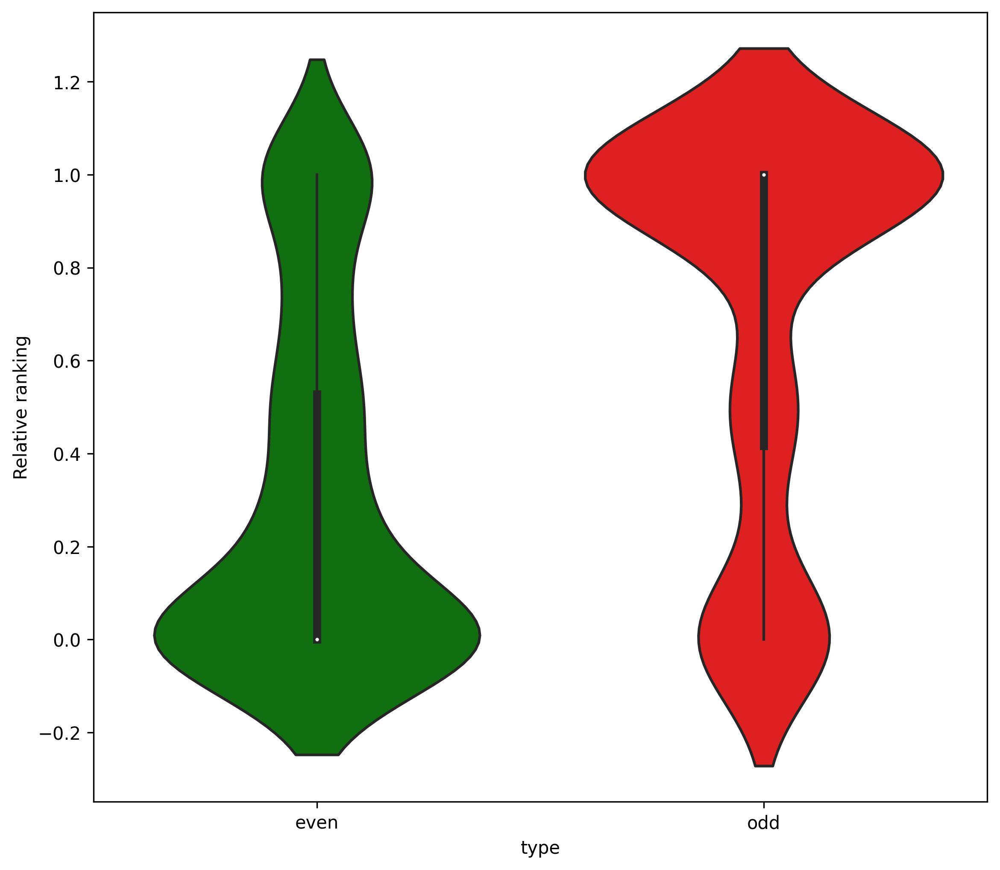

In [18]:
sns.violinplot(eo_df, x='type', y='pos', palette={'even': 'green', 'odd': 'red'})
plt.ylabel('Relative ranking')
plt.show()

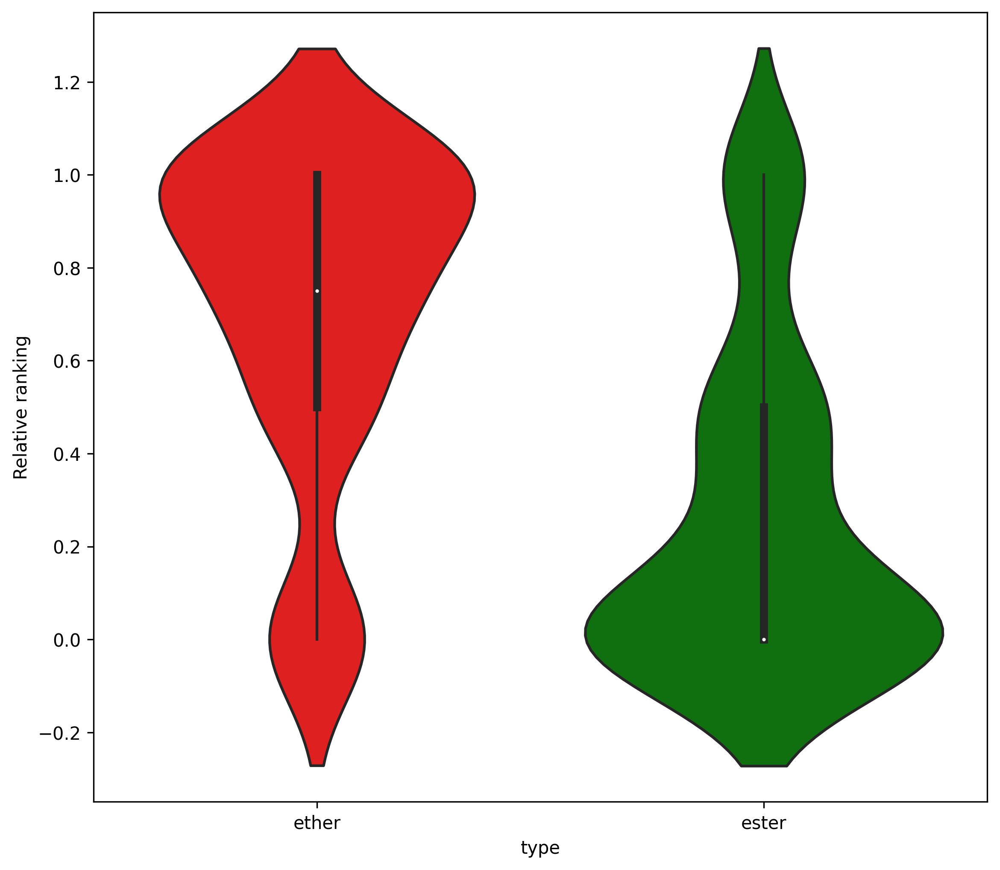

In [19]:
sns.violinplot(ether_df, x='type', y='pos', palette={'ester': 'green', 'ether': 'red'})
plt.ylabel('Relative ranking')
plt.show()

# Downstream analysis

Based on the ranking/network, various downstream analyses can be performed.
I will show a few here. 

So far, some of them require a cut-off to utilize e.g. only the top 2 most likely sum species per ion. This is not perfect and I will work on a better solution. For now, this part of the workflow.


The following analyses require a condition column in `adata.obs` & expect the data to be log transformed.

## Fold changes on networks

Visualze fold changes on networks. In these functions, the ion network can be used and the nodes colored by their log-fold change. This might identify similar changes of metabolically related lipids. 

In [21]:
def net_fc_plot(dat, net, c1, c2, col, ax, labels=False, label_fs=3, pos=None, pos_seed=None, k=.2, ion_labels=False):

    cm1 = lx2m.get_condition_matrices(dat, col, lx2m.get_all_conditions(dat, col))
    lm1 = lx2m.mean_condition_matrices(cm1)

    log2fc = lx2m.logfc_condition_matrices(lm1, c1, c2)
    log2fc = pd.Series(log2fc, index=dat.var.index)
    log2fc[log2fc.isna()] = 0

    rg = max([abs(np.nanmin(log2fc)), abs(np.nanmax(log2fc))])
    cm = plt.get_cmap('coolwarm')
    
    if pos is None:
        pos = nx.spring_layout(net, k=k, seed=pos_seed)

    nx.draw_networkx_nodes(net, pos=pos, node_size=12, 
                           cmap=cm, 
                           vmin=-rg, vmax=rg,
                           node_color=[log2fc[n] for n in net.nodes], ax=ax)
    nx.draw_networkx_edges(net, pos=pos, width=[d['weight']/10 for u, v, d in net.edges(data=True)], ax=ax)
    #nx.draw_networkx_edge_labels(net, 
    #                             pos=pos, 
    #                             edge_labels={(u, v): round(d['weight'], 2) for u, v, d in net.edges(data=True)}, 
    #                             font_size=4)
    if labels:
        if ion_labels:
            nx.draw_networkx_labels(net, pos=lx2m.nudge(pos, 0, 0.01),
                                    font_size=label_fs, ax=ax)
        else:
            nx.draw_networkx_labels(net, pos=lx2m.nudge(pos, 0, 0.01),
                                    labels={k: ", ".join(v['sum_species'].index) for k, v in dict(
                                        net.nodes(data=True)).items()},
                                    font_size=label_fs, ax=ax)
    sm = plt.cm.ScalarMappable(cmap=cm, norm=plt.Normalize(vmin = -rg, vmax=rg))
    #fig.colorbar(im, cax=cax, orientation='horizontal')
    plt.colorbar(sm, label='Log2FC', ax=ax)
    ax.set_title(c1 + ' vs. ' + c2)
    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    
    return pos

In [22]:
# Show all experimental conditions in the dataset
lx2m.get_all_conditions(adata, cond)

['gdIFN Stim', 'gdIFN NStim', 'gd17 NStim', 'gd17 Stim']

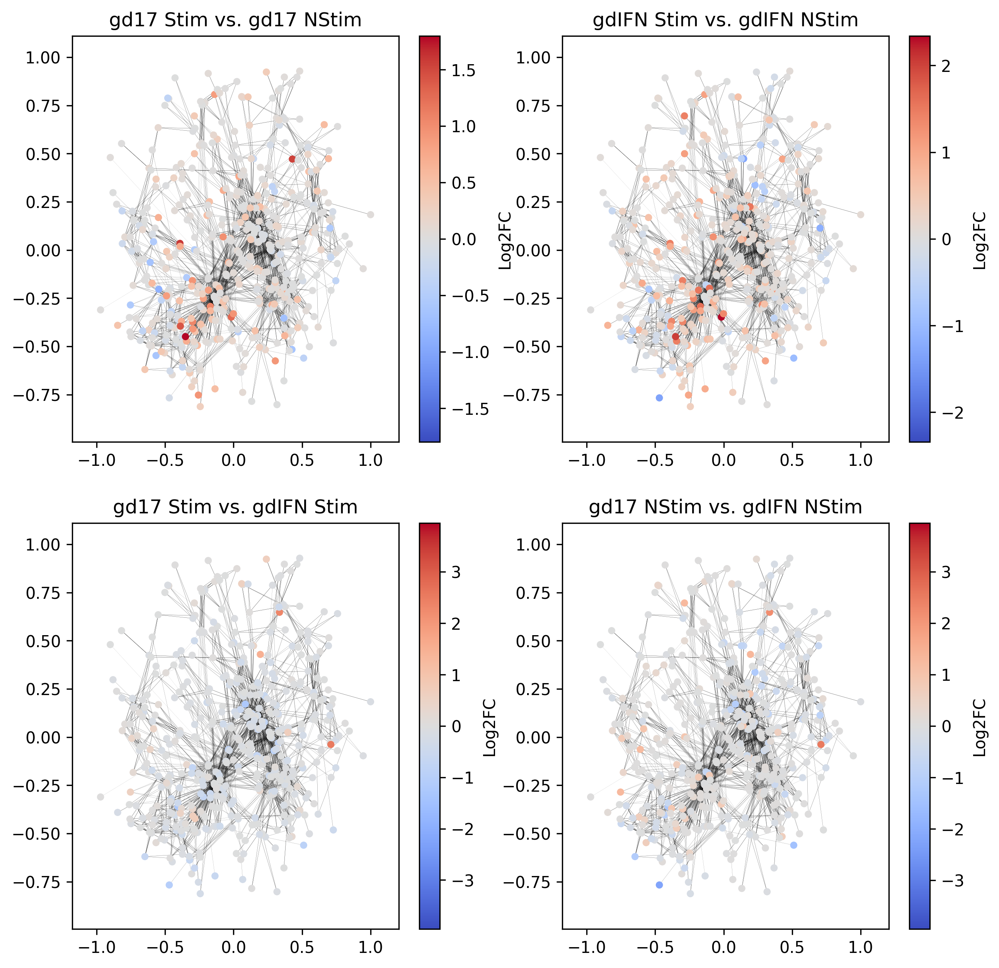

In [23]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

# Using only the biggest connected component from the network.
# Descending smaller components can be selected with -2, -3, ...
# The whole network can be used directly from the `net` variable
subnet=lx2m.get_component(ion_net, position=-1)

col='condition'

pos = net_fc_plot(
    dat=adata,
    net=subnet,
    c1='gd17 Stim',
    c2='gd17 NStim',
    col=col,
    ax=ax1,
    labels=False, # True, to show labels for nodes
    label_fs=4
           )

net_fc_plot(
    dat=adata,
    net=subnet,
    c1='gdIFN Stim',
    c2='gdIFN NStim',
    col=col,
    ax=ax2,
    labels=False,
    pos=pos,
    label_fs=4
           )

net_fc_plot(
    dat=adata,
    net=subnet,
    c1='gd17 Stim',
    c2='gdIFN Stim',
    col=col,
    ax=ax3,
    labels=False,
    pos=pos,
    label_fs=4
           )

net_fc_plot(
    dat=adata,
    net=subnet,
    c1='gd17 NStim',
    c2='gdIFN NStim',
    col=col,
    ax=ax4,
    labels=False,
    pos=pos,
    label_fs=4
           )

plt.show()

## Lipid class distributions

Visualize the abundances of lipid classes for each condition. For this all lipid species of the same class are summed up for each sample. Only the most likely lipids per ion are considred.

In [24]:
# Select the top 2 lipids for each annotation
likelylipids = {k: ([v['sum_species'].index[0], v['sum_species'].index[0]] if 
                   len(v['sum_species']) == 1 else 
                   [v['sum_species'].index[0], v['sum_species'].index[1]]) 
                for k, v in dict(ion_net.nodes(data=True)).items()}

likelylipids = pd.Series(likelylipids)

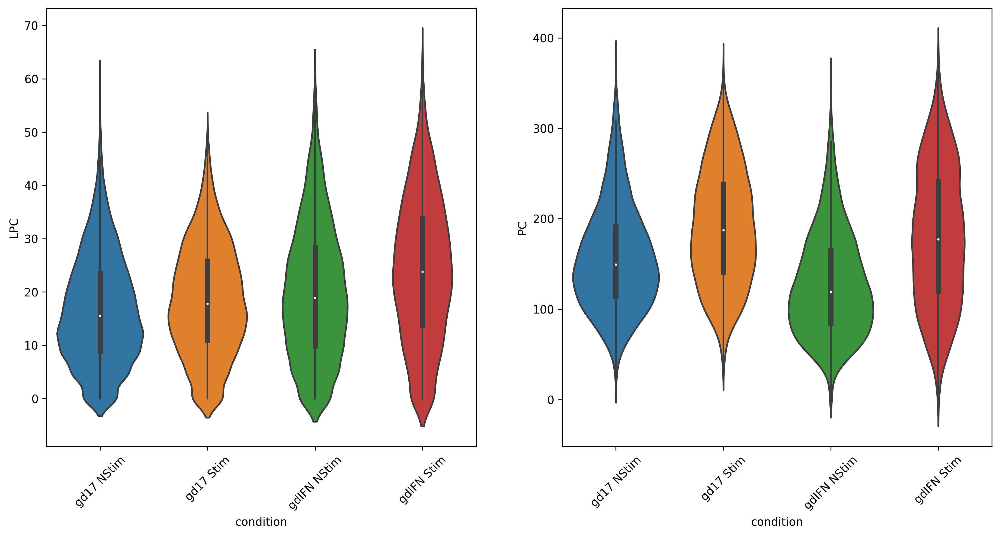

In [31]:
#Select the lipid classes of interest
x1='LPC'
x2='PC'

# Lipid sum species are identified using a regular expression. 
# In this case only Ester lipids are matched. 
# If you explicitly want to match ether lipids, use:  +r'\(O-[0-9]+'
x1pattern = x1+r'\([0-9]+'
x2pattern = x2+r'\([0-9]+'

reduced_adata = adata[:, likelylipids.index]

lpc_df = pd.DataFrame({x1: reduced_adata.X[:, likelylipids.apply(lx2m.match_lipids, 
                                                         pattern=x1pattern)].sum(axis=1),
                       cond: reduced_adata.obs[cond]
                      }, index=reduced_adata.obs.index)

pc_df = pd.DataFrame({x2: reduced_adata.X[:, likelylipids.apply(lx2m.match_lipids, 
                                                        pattern=x2pattern)].sum(axis=1),
                       cond: reduced_adata.obs[cond]
                      }, index=reduced_adata.obs.index)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7))

sns.violinplot(data=lpc_df, x=cond, y=x1, ax=ax1, dropna=True)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
sns.violinplot(data=pc_df, x=cond, y=x2, ax=ax2, dropna=True)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
plt.show()

## Fatty acid distributions

Visualize fold changes of lipids belonging to the same lipid class. Separated by their number of double bonds and fatty acyl carbon atoms. Can give insights to e.g. systematic increase of long chain lipids within one class.

Only the most likely lipids from the ranking are used.

In [89]:
unique_sum_species = lx2m.unique_sum_species(parsed_annotations['parsed_lipids'])

cm1 = lx2m.get_condition_matrices(adata, cond, lx2m.get_all_conditions(adata, cond))
lm1 = lx2m.mean_condition_matrices(cm1)

100%|█████████████████████████████████████████████████████████████████████████████████| 763/763 [00:39<00:00, 19.48it/s]


Text(0.5, 0.98, 'gd17 Stim vs. gd17 NStim')

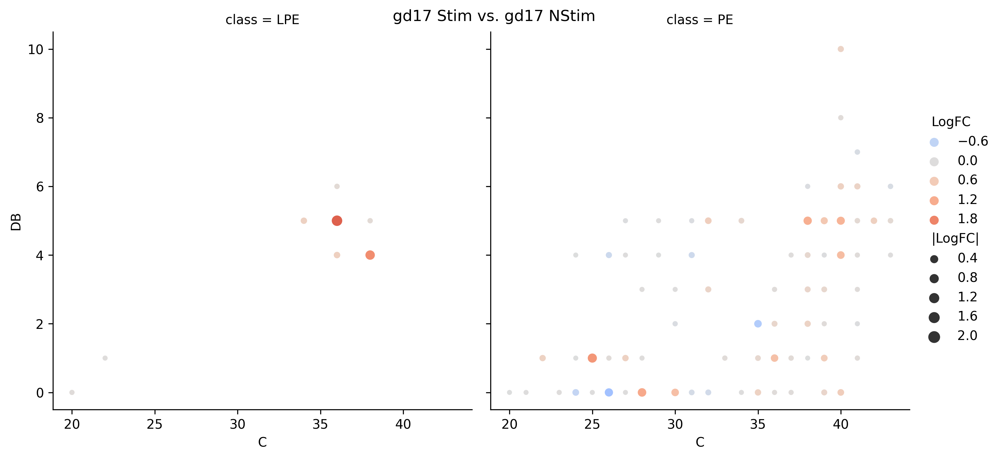

In [90]:
c1='gd17 Stim'
c2='gd17 NStim'

lp_df = lx2m.lipid_bubble_plot(regex_pattern=r'^LPE\([0-9]+', likelilipids=likelylipids,
                      condition1=c1,
                      condition2=c2,
                      reference_lipids=lx2m.get_lx2_ref_lip_dict(),
                      condition_data_dict=cm1,
                      parsed_lipids=parsed_annotations['parsed_lipids']
                         )

p_df = lx2m.lipid_bubble_plot(regex_pattern=r'^PE\([0-9]+', likelilipids=likelylipids,
                      condition1=c1,
                      condition2=c2,
                      reference_lipids=lx2m.get_lx2_ref_lip_dict(),
                      condition_data_dict=cm1,
                      parsed_lipids=parsed_annotations['parsed_lipids']
                        )

col_lims = (-3,3)
lp_df['class']='LPE'
p_df['class']='PE'
rel = sns.relplot(pd.concat([lp_df, p_df]), x='C', y='DB', hue='LogFC', size='|LogFC|',
                palette='coolwarm', hue_norm=col_lims, col='class')
rel.fig.suptitle(c1 + ' vs. ' + c2)